In [1]:
## %%# General
import warnings
warnings.filterwarnings ( "ignore" )
import os
from time import time
from datetime import datetime,timedelta  #time,
import matplotlib.pyplot as plt
import multiprocess as mp
from IPython.display import display

# Scientific and data
import json
import yaml
import numpy as np
from tqdm import tqdm
import pandas as pd
import  xarray as xr
from scipy.ndimage import gaussian_filter1d, gaussian_filter
from scipy.interpolate import griddata
from functools import partial
eps = np.finfo(np.float).eps

# pytorch
import torch , torchvision
import torch.utils.data
import torch.nn as nn
from torch import functional as F
from torch import Tensor
torch.manual_seed(8318)


# Local modules
import  global_settings as gs
import data_loader as dl
import preprocessing as prep
from utils import create_and_configer_logger
from miscLidar import calc_tau,calc_extiction_klett, calc_gauss_curve,generate_poisson_signal, generate_poisson_signal_STEP

In [2]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
import seaborn as sns
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
#sns.set_context('notebook')

## Load extended calibration database

In [3]:
station_name = 'haifa'
station = gs.Station ( stations_csv_path = 'stations.csv' , station_name = station_name )
# print(station)
start_date = datetime ( 2017 , 9 , 1 )
end_date = datetime ( 2017 , 10 , 31 )
ds_path_extended = f"dataset_{station_name}_{start_date.strftime ( '%Y-%m-%d' )}_{end_date.strftime ( '%Y-%m-%d' )}_extended.nc"
csv_path_extended = f"dataset_{station_name}_{start_date.strftime ( '%Y-%m-%d' )}_{end_date.strftime ( '%Y-%m-%d' )}_extended.csv"
df = pd.read_csv ( csv_path_extended )
ds_extended = prep.load_dataset ( ds_path_extended)
wavelengths = [355,532,1064]
#display(ds_extended)

#### Choose a day

In [4]:
df_times = ds_extended.Time.to_pandas()
time_00 = datetime.today().time().min
days = [datetime.combine(day,time_00) for day in sorted(df_times.groupby(df_times.dt.date).groups.keys())]
day_number =0
day = days[day_number]
day_str = day.strftime('%Y-%m-%d')
# %%
date_datetime = datetime.strptime(day_str,'%Y-%m-%d')
min_t = datetime.combine(date_datetime.date(), date_datetime.time().min)
max_t = date_datetime + timedelta(hours = 24) - timedelta(seconds = 30)
t_slice = slice(min_t,date_datetime.date()+timedelta(days=1))
arr_day = []
time_indx = pd.date_range(start = min_t, end = max_t,freq = '30S')
# %%

#### Create calibration daily dataset

In [5]:
# %%
for wavelength in [355,532,1064]:
	ds_i = ds_extended.sel(Wavelength = wavelength,Time= t_slice)#.copy(deep = True)
	ds_i = ds_i.resample(Time='30S').interpolate('nearest')
	ds_i = ds_i.reindex({"Time" : time_indx}, method="nearest",fill_value =  0)
	arr_day.append(ds_i)
ds_day = xr.concat(arr_day,dim = 'Wavelength')

#ds_day
# %%

## Plotting the Lidar constant and reference heights of the day

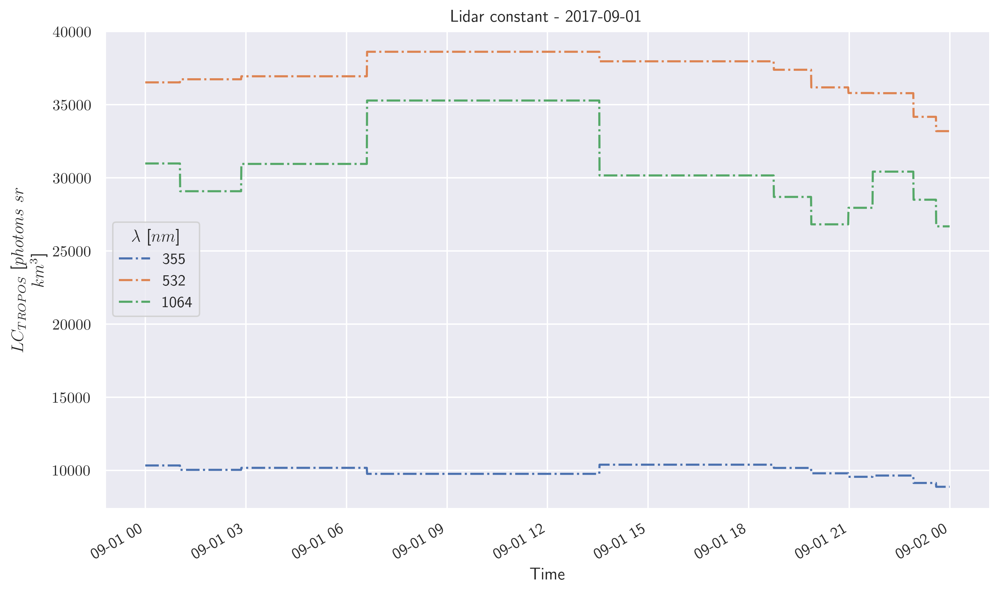

In [6]:
# %%
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10,6))
ax = axes
ds_day.LC.plot(x='Time',hue='Wavelength',ax=ax,linestyle ='-.')
ax.set_title(f'Lidar constant - {day_str}')
#plt.legend()
plt.tight_layout()
plt.show()

DISP_FIG = False
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10,6))
	ax = axes
	for r in ['r0','r1','rm']:
		ds_day[r].sel(Wavelength=355).plot(label=ds_day[r].long_name,ax=ax)
	ax.set_title(fr'Reference Range - {day_str}')
	ax.set_ylabel(r'$\rm Height[km]$')
	plt.legend()
	plt.tight_layout()
	plt.show()
# %%

In [7]:
ds_day.LC.attrs['long_name'] = r'$\rm LC_{TROPOS}$'
ds_day.LC.attrs['units'] = r'$photons$'+r'$\cdot$'+r'$sr$'+r'$km^3$'

## Load generated aerosol profiles

In [8]:
foler_aer = r'D:\data_haifa\GENERATION\aerosol_dataset\09'
nc_aer = '2017_09_01_Haifa_aerosol.nc'
ds_aer = prep.load_dataset(os.path.join(foler_aer,nc_aer))

In [9]:
if DISP_FIG:
	height_slice=slice(0.0,10.5)
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_aer.sigma.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_aer.beta.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

In [10]:
## Load molecular profiles

In [11]:
nc_name = r'2017_09_01_Haifa_molecular.nc'
folder_name = r'D:\data_haifa\DATA FROM TROPOS\molecular_dataset\2017\09'
ds_mol = prep.load_dataset(os.path.join(folder_name,nc_name))

if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_mol.sigma.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_mol.beta.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Summing aerosol and molecular profiles
### $\beta = \beta_{aer}+\beta_{mol}$
### $\sigma = \sigma_{aer}+\sigma_{mol}$
### The molecular profiles were calculated from radiosondes measurements from NOA
> TODO: Blend or "fade" the aerosol layer before adding to molecular ednsity

In [12]:
ds_total = xr.zeros_like(ds_mol)
ds_total= ds_total.assign(date= ds_mol.date)
ds_total.attrs = {'info': 'Daily generated profiles',
                'sources_file': 'generate_density.ipynb',
                'location': station.name,
}
ds_aer.lambda_nm.loc[:]=[355,532,1064]

In [13]:
ds_total.sigma.loc[:] = ds_mol.sigma + ds_aer.sigma
ds_total.beta.loc[:] = ds_mol.beta + ds_aer.beta
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.sigma.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.beta.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()


## Calculating $\beta\exp(-2\tau)$

In [14]:

alt_km = station.altitude*1e-3
heights = ds_total.Height.values - alt_km
dr = heights[1]-heights[0]

exp_tau_c =[]
for wavelength in wavelengths:
	exp_tau_t =[]
	for t in tqdm(ds_total.Time):
		sigma_t = ds_total.sigma.sel(Time= t)
		e_tau = xr.apply_ufunc(lambda x: np.exp(-2*calc_tau(x,heights)),
		                       sigma_t.sel(Wavelength= wavelength),keep_attrs = True)
		e_tau.name = r'$\exp(-2 \tau)$'
		exp_tau_t.append(e_tau)

	exp_tau_c.append(xr.concat(exp_tau_t,dim = 'Time'))
exp_tau_d = xr.concat(exp_tau_c,dim = 'Wavelength')
exp_tau_d = exp_tau_d.transpose('Wavelength','Height','Time' )
ds_total.attbsc.loc[:] = exp_tau_d.loc[:]*ds_total.beta

for profile in ['beta','sigma','attbsc']:
    ds_total[profile].attrs['info'] = ds_total[profile].attrs['info'].replace('Molecular','Total')


100%|██████████| 2880/2880 [00:04<00:00, 685.04it/s]


In [15]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.attbsc.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Daily lidar constant

In [16]:
## Plotting the Lidar constant and reference heights of the day

In [17]:
# %%
ds_smooth = ds_day.apply(func = gaussian_filter1d,sigma=200,keep_attrs =True)
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10,6))
	ax = axes

	ds_day.LC.plot(x='Time',hue='Wavelength',ax=ax,linestyle='-.')
	ds_smooth.LC.plot(x='Time',hue='Wavelength',ax=ax)
	ax.set_title(f'Lidar constant - {day_str}')
	plt.tight_layout()
	plt.show()

## Calculatin $p=LC\cdot\beta\exp(-2tau)$
- Calculate a new Lidar signal $p$,using the smoothed $LC$ values during the day (see ds_smooth above)

In [18]:
rr = heights**2
pr2_c =[]
for wavelength in wavelengths:
    pr2_t =[]
    p_t=[]
    for t in tqdm(ds_total.Time,desc = f'Time loop for {wavelength}'):
        attbsc_t = ds_total.attbsc.sel(Time= t)
        LC_t = ds_smooth.LC.sel(Time = t)
        pr2 = xr.apply_ufunc(lambda x,y:(x*y)  ,
                            attbsc_t.sel(Wavelength= wavelength),
                            LC_t.sel(Wavelength= wavelength),keep_attrs = True)
        pr2.name = r'$pr2$'
        pr2_t.append(pr2)
        
    pr2_c.append(xr.concat(pr2_t,dim = 'Time'))
    
pr2_d = xr.concat(pr2_c,dim = 'Wavelength')
pr2_d = pr2_d.transpose('Wavelength','Height','Time' )
pr2_d.attrs['info']='Lidar Range Corrected Signal'
pr2_d.attrs['long_name']=r'$p$'+r'$\cdot r^2$'
pr2_d.attrs['units']=r'$\rm$'+r'$photons$'+r'$\cdot km^2$'



Time loop for 1064: 100%|██████████| 2880/2880 [00:08<00:00, 321.76it/s]


In [19]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pr2_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

In [20]:
ds_total = ds_total.assign(rr= xr.Variable(dims=('Wavelength','Height'),data=np.tile(heights,(3,1))**2))
p_d= (pr2_d/ds_total.rr).astype(int)
p_d.attrs['info']='Lidar Signal'
p_d.attrs['long_name']=r'$p$'
p_d.attrs['units']=r'$photons$'
p_d.name=r'$p$'


In [21]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		p_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

## Daily background
- Create a mean background noise $<p_{bg}>$

#### 1. Load parameters of gaussian curve fit

In [22]:
bg_signal_folder = os.path.join(os.getcwd(),'background_signal')
bg_params_path = os.path.join(bg_signal_folder,'curve_params.yml')
with open(bg_params_path,'r') as ymlfile:
        params = yaml.safe_load(ymlfile)
#params

#### 2.Time resolution adjustments of the curve fitting
- The ratio is to adjust time bins $t$ to lidar sampling bins (delta_t=30[s] ) 
- the estimated curve refer to delta_t=100[s], bins_per_day=864


In [23]:
bins_per_day = p_d.Time.shape[0]
t = np.arange(0,bins_per_day) 
bins_ratio = bins_per_day/params['bins_per_day']

#### 3. Calculate bg mean of the day

In [24]:
'''generate background signal'''
bg_new = []
high_curves =[]
low_curves =[]
for chan in ['UV','G','IR']:
    prms_h = params[chan]['high']
    prms_l = params[chan]['low']

    ''' Calculating bounding curves series'''
    high_curve = calc_gauss_curve(t,prms_h['A'],prms_h['H'],bins_ratio*prms_h['t0'],bins_ratio*prms_h['W'])
    low_curve = calc_gauss_curve(t,prms_l['A'],prms_l['H'],bins_ratio*prms_l['t0'],bins_ratio*prms_l['W'])
    high_curves.append(high_curve)
    low_curves.append(low_curve)
    ''' Generating new random series of background signal'''
    mean_val = 0.5*(low_curve+high_curve)
    std_val = 0.25*(high_curve-low_curve)
    bg_new_chan = mean_val.reshape(bins_per_day,1)+\
                  np.matmul(np.diagflat(std_val),np.random.randn(bins_per_day,1))
    bg_new.append(bg_new_chan)


In [25]:
bg_new = np.array(bg_new)
bg_new[bg_new<0]=eps
ds_total = ds_total.assign(bgmean= xr.Variable(dims=('Wavelength','Time'),data=bg_new.reshape((3,2880))))
ds_total.bgmean.attrs['info']='Background Mean Signal'
ds_total.bgmean.attrs['long_name']=r'$<p_{bg}>$'
ds_total.bgmean.attrs['units']=r'$photons$'
ds_total.bgmean.name=r'$pbg$'
if DISP_FIG:
	fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7,5))
	ds_total.bgmean.plot(hue='Wavelength',ax=ax)
	plt.show()

#### 4. Calculate $P_{measure}$
- Calculate a new signal $p_{new} \sim Poiss (\mathbb{E} (p) ) $, $s.t.\;\mathbb{E} (p)  = p + <p_{bg}>$

In [26]:
p_mean = p_d + ds_total.bgmean
p_std = xr.apply_ufunc(lambda x: np.sqrt(x),p_mean,keep_attrs =True)
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		p_mean.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

In [27]:
rand_P = p_std * np.random.normal(loc=0, scale=1.0, size=p_std.shape)
pn_d = (p_mean+rand_P).astype(int)

if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pn_d.where(pn_d<0).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

In [28]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pn_d.where(pn_d>=0).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

In [29]:
pn_dp = pn_d.where(pn_d>=0.0)
pr2n_d= (pn_dp*ds_total.rr).astype(int)
pr2n_d.attrs['info']='Lidar Range Corrected Signal - noisy'
pr2n_d.attrs['long_name']=r'$p$'+r'$\cdot r^2$'
pr2n_d.attrs['units']=r'$\rm$'+r'$photons$'+r'$\cdot km^2$'


In [30]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pr2n_d.where(pr2n_d>=0.0).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

In [31]:
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pr2n_d.where(pr2n_d<0).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()


In [34]:
pn =  xr.apply_ufunc(lambda x: generate_poisson_signal_STEP(x,p_mean.Height.size).astype(int),
p_mean.sel(Wavelength= wavelength,Time = p_mean.Time[0]),keep_attrs =True,dask = 'parallelized')
#pn

In [32]:
def poiss_wav (p_wavelength):
	from tqdm import tqdm
	import xarray as xr
	import miscLidar as mscLid
	pn_t =[]
	wavelength = int((p_wavelength.Wavelength).values)
	for t in tqdm(p_wavelength.Time,desc = f'Time loop {wavelength}|'):
		pn_t.append(xr.apply_ufunc(lambda x: mscLid.generate_poisson_signal_STEP(x,p_wavelength.Height.size),
		                           p_wavelength.sel(Time = t),
		                           keep_attrs =True,dask = 'parallelized'))
	return pn_t

In [33]:
import multiprocess as mp
pn_c =[]
pwavs = [p_mean.sel(Wavelength= wavelength) for wavelength in wavelengths]
with mp.Pool(3) as p :
	pn_t = p.map(poiss_wav ,pwavs)


In [35]:
pn_c = [xr.concat(pn_t_i,dim = 'Time') for pn_t_i in pn_t]
pn_d = xr.concat(pn_c,dim = 'Wavelength')
pn_d = pn_d.transpose('Wavelength','Height','Time' )
pn_d.attrs['info']='Poisson Lidar Signal'
pn_d.attrs['long_name']=r'$p$'
pn_d.attrs['units']=r'$\rm$'+r'$photons$'

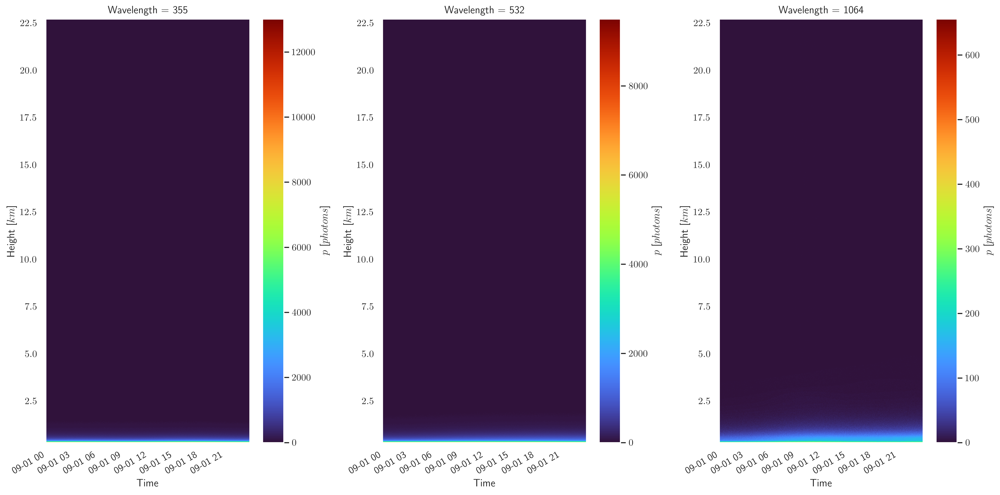

In [56]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
for wavelength,ax in zip(wavelengths,axes.ravel()):
	pn_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
plt.tight_layout()
plt.show()

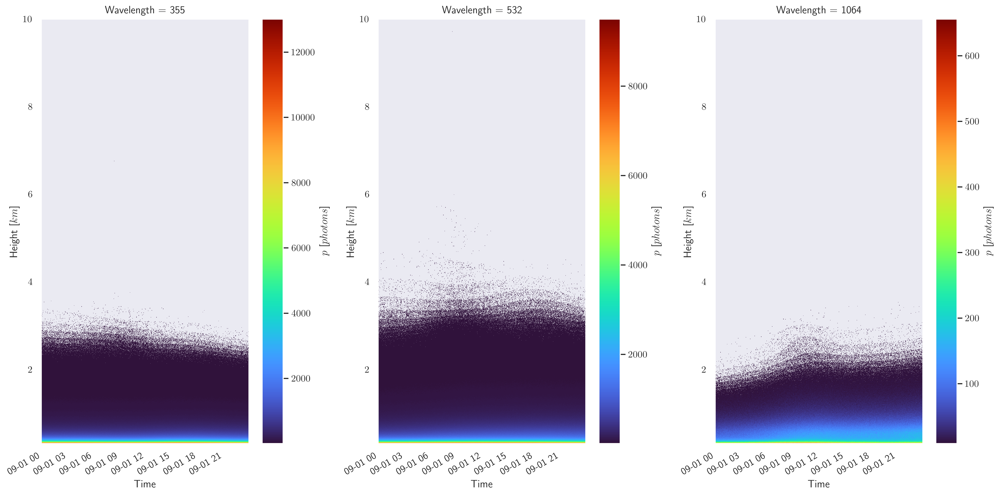

In [59]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
for wavelength,max_v, ax in zip(wavelengths,[8,8,8],axes.ravel()):
	pn_d.where(pn_d>max_v).sel(Wavelength = wavelength,Height=slice(0.0,10.0)).plot(cmap='turbo',ax=ax)
plt.tight_layout()
plt.show()

In [60]:
pr2n_d= (pn_d*ds_total.rr).astype(int)

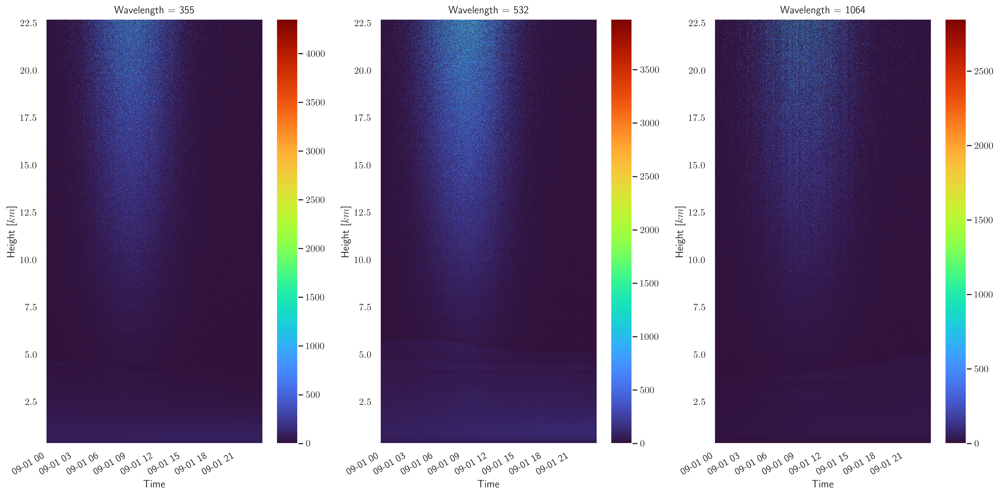

In [62]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
for wavelength,ax in zip(wavelengths,axes.ravel()):
	pr2n_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
plt.tight_layout()
plt.show()

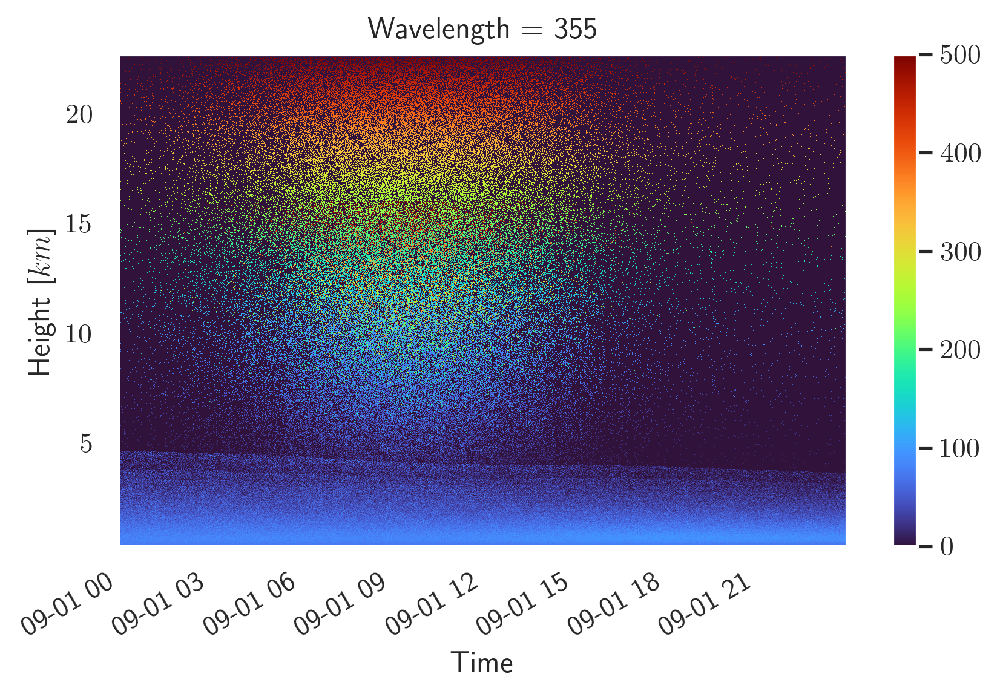

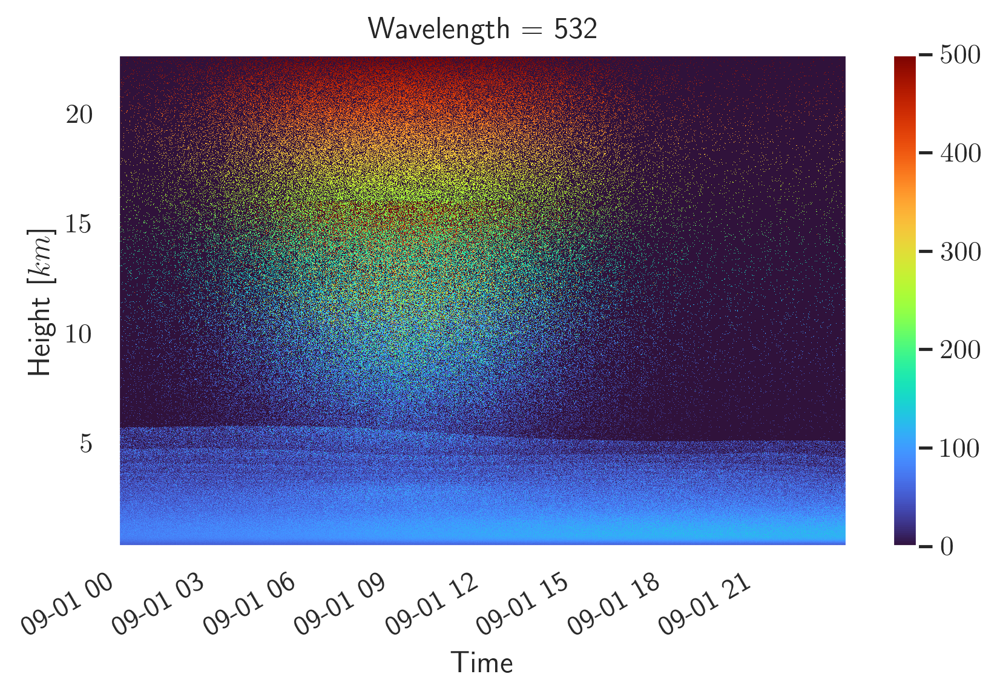

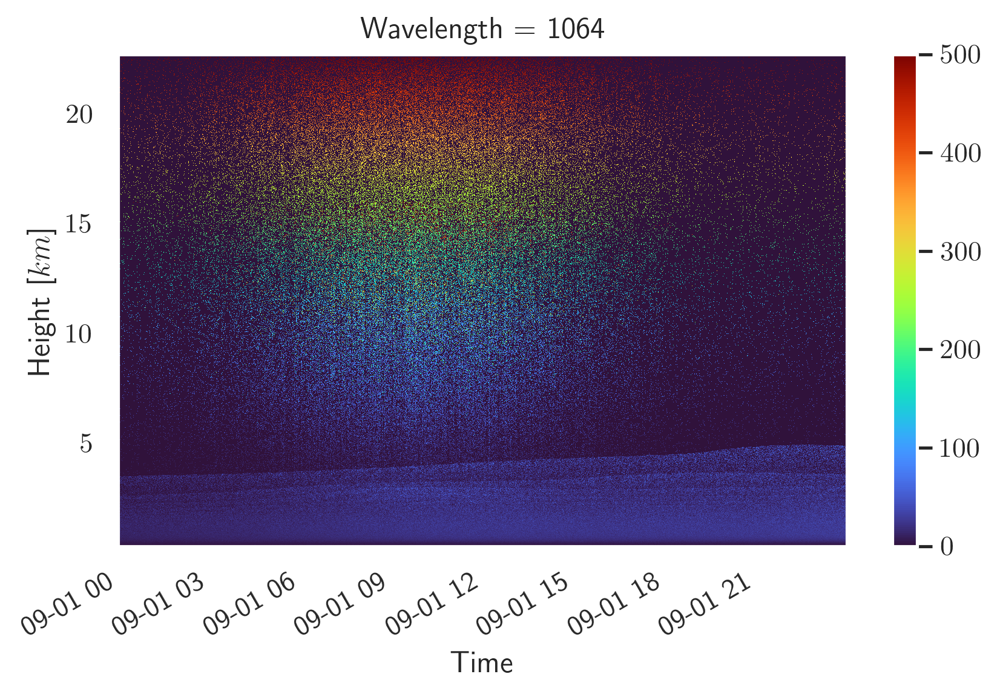

In [88]:
#fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
for wavelength,max_v,ax in zip(wavelengths,[500,500,500],axes.ravel()):
	pr2n_d.where(pr2n_d<=max_v).sel(Wavelength = wavelength).plot(cmap='turbo')#,ax=ax)
	plt.tight_layout()
	plt.show()
#plt.tight_layout()
#plt.show()

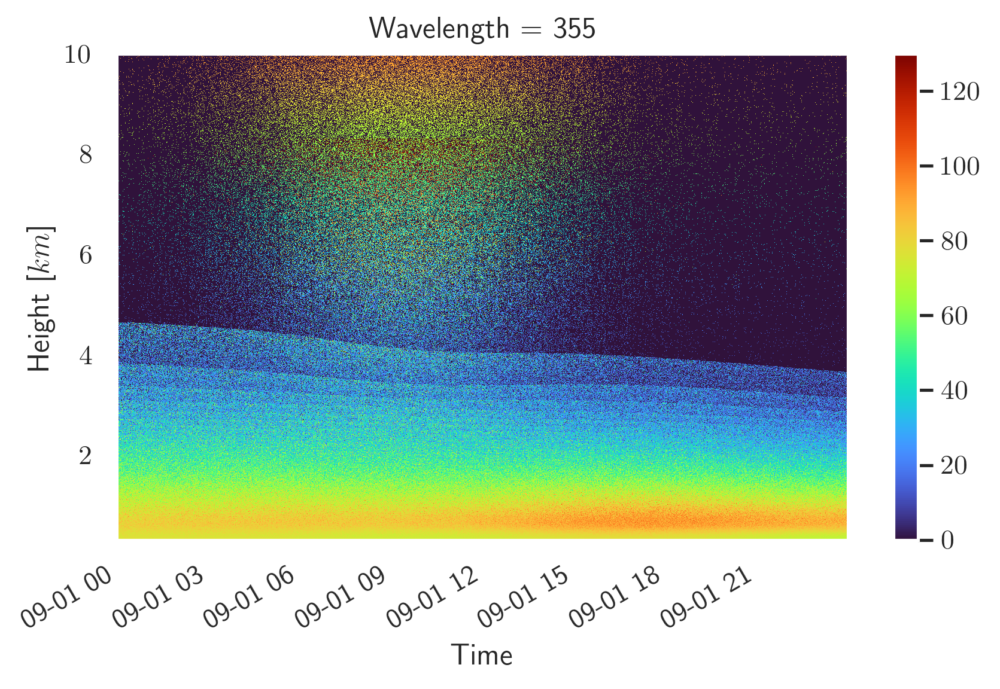

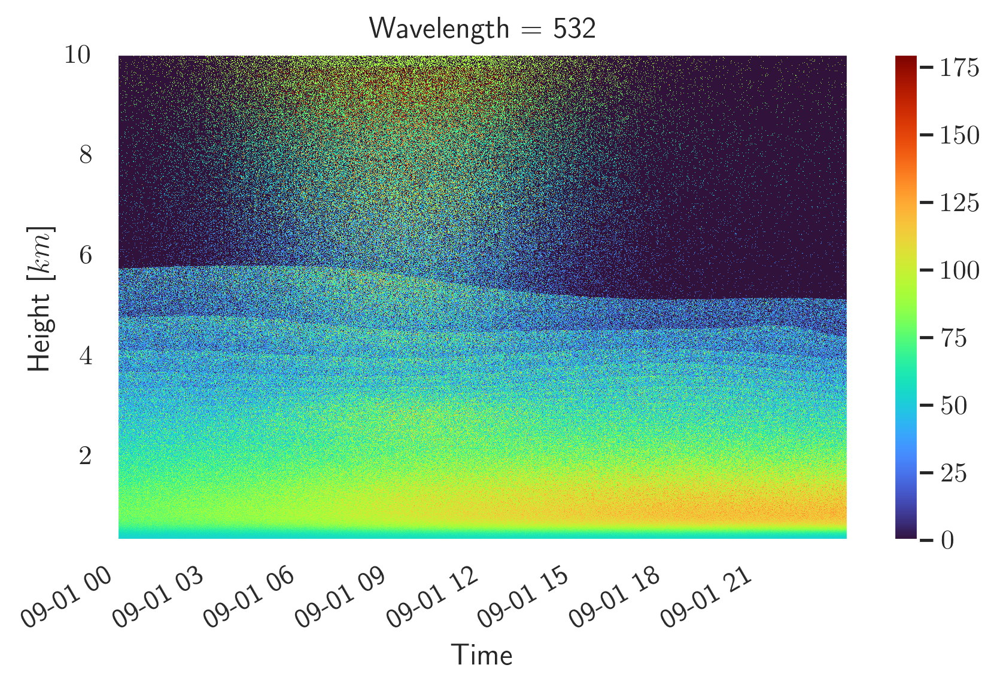

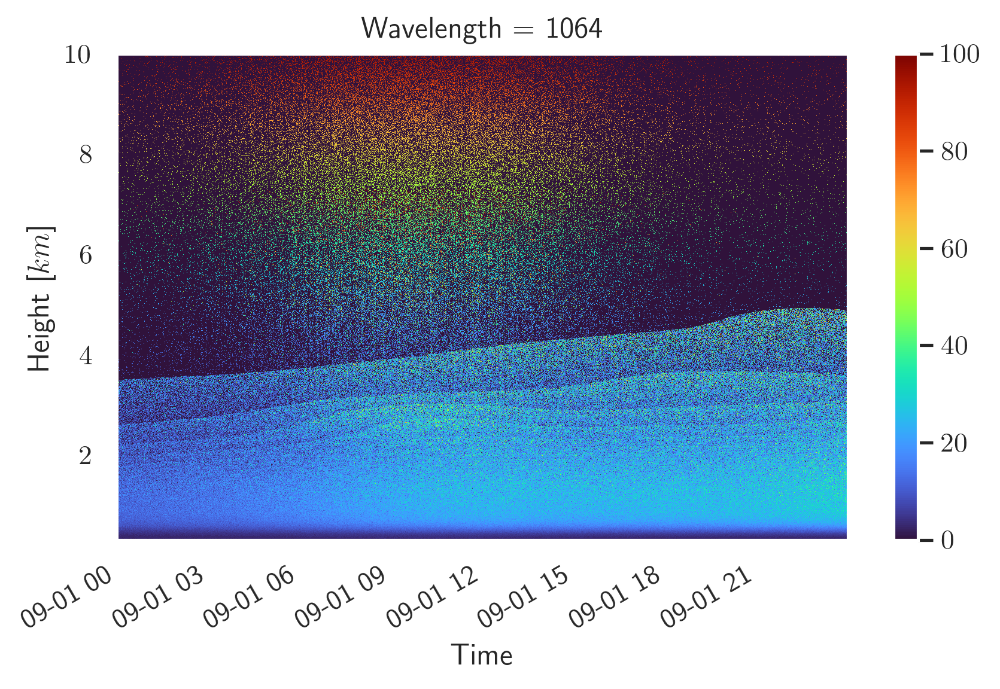

In [82]:
#fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
for wavelength,max_v,ax in zip(wavelengths,[130,180,100],axes.ravel()):
	pr2n_d.where(pr2n_d<=max_v).sel(Wavelength = wavelength,
	                                                Height=slice(0.0,10.0)).plot(cmap='turbo')#,ax=ax)
	plt.tight_layout()
	plt.show()
#plt.tight_layout()
#plt.show()

